In [580]:
from model_gradcam_code import *
from utils import *


import random
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

In [581]:
df = pd.read_csv('images/data.csv', sep='\t')
df

,filename,tortuous,tortuous_points
0,images/tortuous/0.png,1,"[(573.6222026782206, 132.54680276738213), (456..."
1,images/tortuous/1.png,1,"[(211.97427214185615, 464.3646937645268), (254..."
2,images/tortuous/2.png,1,"[(193.2826815856427, 319.5667894455212), (199...."
3,images/tortuous/3.png,1,"[(219.68963451599217, 339.35612070918205), (57..."
4,images/tortuous/4.png,1,"[(301.01794476009184, 161.3606998669253), (66...."
...,...,...,...
1995,images/non_tortuous/995.png,0,[]
1996,images/non_tortuous/996.png,0,[]
1997,images/non_tortuous/997.png,0,[]
1998,images/non_tortuous/998.png,0,[]


2897 19121


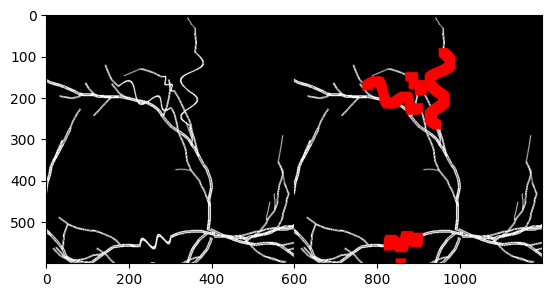

In [582]:
idx = random.randint(0, len(df)//2)

img_name = df.iloc[idx]['filename']
tortuous_points = df.iloc[idx]['tortuous_points']
tortuous_points = parse_points_list(tortuous_points)

final_tortuous_points = set()

img = Image.open(img_name)
img = np.array(img)
initial_img = img.copy()

fig, ax = plt.subplots()
ax.imshow(img)

dx = dy = 10
for (x, y) in tortuous_points:
    for i in range(x-dx, x+dx+1):
        for j in range(y-dy, y+dy+1):
            if 0 <= i < img.shape[0] and 0 <= j < img.shape[1]:
                final_tortuous_points.add((i, j))
                img[i][j] = [255, 0, 0]

print(len(tortuous_points), len(final_tortuous_points))


plt.imshow(np.hstack([initial_img, img]))

In [583]:
def get_all_tortous_points(tortuous_points):
    tortuous_points = parse_points_list(tortuous_points)

    final_tortuous_points = set()
    dx = dy = 10
    for (x, y) in tortuous_points:
        for i in range(x-dx, x+dx+1):
            for j in range(y-dy, y+dy+1):
                if 0 <= i < ORIG_IMG_SIZE and 0 <= j < ORIG_IMG_SIZE:
                    final_tortuous_points.add((i, j))

    print(len(tortuous_points), len(final_tortuous_points))
    return final_tortuous_points

In [584]:
def get_random_sample(n = 5, cls="1"):
    samples = test_df[test_df.tortuous == cls].sample(n)
    images = np.array([open_image(filename) for filename in samples.filename])
    tortuous_points_batch = [get_all_tortous_points(tortuous_points) for tortuous_points in samples.tortuous_points]
    pred_labels = tf.argmax(global_model(tf.convert_to_tensor(images)), axis=1).numpy().tolist()
    return images, samples.tortuous, pred_labels, tortuous_points_batch

In [585]:
def split_heatmap_percentile(heatmap, min_threshold_percentile, max_threshold_percentile):
    min_percentile_value = np.percentile(heatmap, min_threshold_percentile)
    max_percentile_value = np.percentile(heatmap, max_threshold_percentile)

    return (np.where(heatmap <= min_percentile_value, 1, 0),
            np.where(heatmap >= max_percentile_value, 1, 0))

def split_heatmap_threshold(heatmap, min_threshold, max_threshold):
    return (np.where(heatmap <= min_threshold, 1, 0),
            np.where(heatmap >= max_threshold, 1, 0))

def get_cropped_images(images, min_thres, max_thres):
    heatmaps, _, _ = generate_gradcam_batch_withheat(images, global_model, 0.5)
    regions_batch = [split_heatmap_percentile(heatmap.numpy(), min_thres, max_thres) for heatmap in heatmaps]

    cropped_regions_batch = [
        [img*np.stack([region] * 3, axis=-1) for region in regions] 
        for img, regions in zip(images, regions_batch)
    ]

    return cropped_regions_batch

In [586]:
MIN_THRESHOLD_PERCENTILE = 10
MAX_THRESHOLD_PERCENTILE = 95
N = 50
MIN_LENGTH = 10
ORIG_IMG_SIZE = 600

In [587]:
images, labels, pred_labels, tortuous_points_batch = get_random_sample(N, cls="1")

1958 9263
5181 34631
6065 30668
3672 19561
9242 33010
4034 29264
9022 44143
4396 22994
2696 17027
2101 15276
8001 47582
7200 38278
9360 56261
10733 51798
5226 30296
5676 28441
10914 58958
3659 16638
5973 33820
3672 23904
3872 22960
6507 40586
6564 29842
2581 16710
3899 15688
2880 15117
2443 13334
2263 13989
9897 47402
7256 43758
2869 15423
4648 23542
5529 34425
2689 6821
13180 68877
7808 38231
3600 31534
7028 39583
8861 52920
3801 26282
7693 53885
6647 40237
4523 23475
4110 25573
2257 7055
6917 38688
5912 41300
2296 16222
10979 51012
2880 18219


In [588]:
cropped_regions_batch = get_cropped_images(images, MIN_THRESHOLD_PERCENTILE, MAX_THRESHOLD_PERCENTILE)

In [589]:
# In the cropped images, check how many tortuous points are present

def get_tortuous_points_in_region(images, cropped_region_batch, tortuous_points_batch):
    n = len(images)
    fig, axs = plt.subplots(n, 4, figsize=(12, n * 3))

    percentage_scores = []

    # plt.suptitle(r"Total tortuous points, Points in region, Tortuous points in region, % of tortuous points captured, % of captured that are tortuous")
    for i, orig_img, cropped_region, tortuous_points in zip(range(n), images, cropped_region_batch, tortuous_points_batch):
        high_att_gradcam = cropped_region[1][:, :, 0]

        # Create an image with the tortuous points
        tortuous_img = np.zeros((ORIG_IMG_SIZE, ORIG_IMG_SIZE))
        for (x, y) in tortuous_points:
            tortuous_img[x, y] = 1
        tortuous_img = Image.fromarray(tortuous_img.astype(np.uint8))
        tortuous_img = tortuous_img.resize((IMG_SIZE, IMG_SIZE))
        tortuous_img = np.array(tortuous_img).astype(np.float32)

        tortuous_img *= orig_img[:, :, 0]

        num_tortuous_points = tortuous_img.sum()

        cnt = np.sum(high_att_gradcam*tortuous_img)

        print(f"Image: {i+1}")
        print(f"Total points: {num_tortuous_points}, Total points captured: {np.sum(high_att_gradcam)}, Tortuous points captured: {cnt}")
        print(f"{cnt/num_tortuous_points*100:.2f}% of tortuous points are captured by the gradcam")
        print(f"{cnt/np.sum(high_att_gradcam)*100:.2f}% of the captured region is tortuous")

        percentage_scores.append((cnt/np.sum(high_att_gradcam)*100, cnt/num_tortuous_points*100))

        axs[i, 0].imshow(orig_img[:, :, 0], cmap='gray')
        axs[i, 0].set_title("Image")


        axs[i, 1].imshow(tortuous_img, cmap='gray')
        axs[i, 1].set_title("Tortuous regions (Ground truth)")
        
        axs[i, 2].imshow(high_att_gradcam, cmap='gray')
        axs[i, 2].set_title("High attention region")

        axs[i, 3].imshow(high_att_gradcam*tortuous_img, cmap='gray')
        axs[i, 3].set_title(
            f"Overlap P: ({cnt/np.sum(high_att_gradcam)*100:.2f}%) | R: ({cnt/num_tortuous_points*100:.2f}%)"
        )
            # ({cnt/num_tortuous_points*100:.2f}%) of tortuous points are captured by the gradcam

    # Print mean of percentage scores
    consolidated_scores = np.mean(percentage_scores, axis=0)
    print(f"Mean of percentage scores: {consolidated_scores}")


    plt.tight_layout()
    plt.show()
    return consolidated_scores

Image: 1
Total points: 278.0, Total points captured: 374.0, Tortuous points captured: 149.0
53.60% of tortuous points are captured by the gradcam
39.84% of the captured region is tortuous
Image: 2
Total points: 1380.0, Total points captured: 496.0, Tortuous points captured: 465.0
33.70% of tortuous points are captured by the gradcam
93.75% of the captured region is tortuous
Image: 3
Total points: 1129.0, Total points captured: 384.0, Tortuous points captured: 279.0
24.71% of tortuous points are captured by the gradcam
72.66% of the captured region is tortuous
Image: 4
Total points: 958.0, Total points captured: 578.0, Tortuous points captured: 446.0
46.56% of tortuous points are captured by the gradcam
77.16% of the captured region is tortuous
Image: 5
Total points: 1290.0, Total points captured: 335.0, Tortuous points captured: 281.0
21.78% of tortuous points are captured by the gradcam
83.88% of the captured region is tortuous
Image: 6
Total points: 1083.0, Total points captured: 391

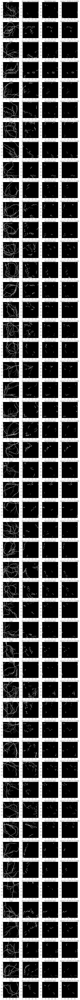

array([81.48976722, 31.87090092])

In [590]:
get_tortuous_points_in_region(images, cropped_regions_batch, tortuous_points_batch)

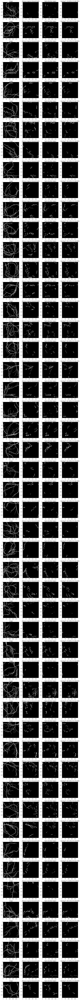

Image: 1
Total points: 278.0, Total points captured: 525.0, Tortuous points captured: 168.0
60.43% of tortuous points are captured by the gradcam
32.00% of the captured region is tortuous
Image: 2
Total points: 1380.0, Total points captured: 962.0, Tortuous points captured: 716.0
51.88% of tortuous points are captured by the gradcam
74.43% of the captured region is tortuous
Image: 3
Total points: 1129.0, Total points captured: 736.0, Tortuous points captured: 432.0
38.26% of tortuous points are captured by the gradcam
58.70% of the captured region is tortuous
Image: 4
Total points: 958.0, Total points captured: 962.0, Tortuous points captured: 679.0
70.88% of tortuous points are captured by the gradcam
70.58% of the captured region is tortuous
Image: 5
Total points: 1290.0, Total points captured: 601.0, Tortuous points captured: 484.0
37.52% of tortuous points are captured by the gradcam
80.53% of the captured region is tortuous
Image: 6
Total points: 1083.0, Total points captured: 729

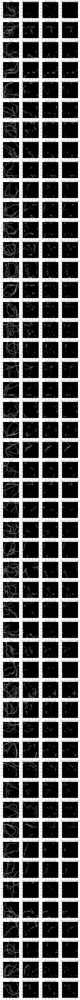

Image: 1
Total points: 278.0, Total points captured: 374.0, Tortuous points captured: 149.0
53.60% of tortuous points are captured by the gradcam
39.84% of the captured region is tortuous
Image: 2
Total points: 1380.0, Total points captured: 496.0, Tortuous points captured: 465.0
33.70% of tortuous points are captured by the gradcam
93.75% of the captured region is tortuous
Image: 3
Total points: 1129.0, Total points captured: 384.0, Tortuous points captured: 279.0
24.71% of tortuous points are captured by the gradcam
72.66% of the captured region is tortuous
Image: 4
Total points: 958.0, Total points captured: 578.0, Tortuous points captured: 446.0
46.56% of tortuous points are captured by the gradcam
77.16% of the captured region is tortuous
Image: 5
Total points: 1290.0, Total points captured: 335.0, Tortuous points captured: 281.0
21.78% of tortuous points are captured by the gradcam
83.88% of the captured region is tortuous
Image: 6
Total points: 1083.0, Total points captured: 391

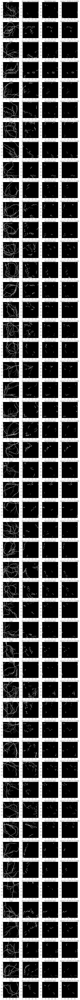

[array([57.34445609, 65.57571528]), array([63.05261888, 61.22807757]), array([64.44557454, 59.78165132]), array([72.81262688, 47.66552001]), array([81.48976722, 31.87090092])]


In [594]:
threshold_percentiles = [50, 75, 80, 90, 95]
results = []
for percentile in threshold_percentiles:
    cropped_regions_batch = get_cropped_images(images, 10, percentile)
    result = get_tortuous_points_in_region(images, cropped_regions_batch, tortuous_points_batch)
    results.append(result)
print(results)

In [596]:
for result in results:
    print(result)

[57.34445609 65.57571528]
[63.05261888 61.22807757]
[64.44557454 59.78165132]
[72.81262688 47.66552001]
[81.48976722 31.87090092]


In [597]:
# calculate f1 score for the results
def calculate_f1_score(precision, recall):
    return 2 * (precision * recall) / (precision + recall)

for result in results:
    print(calculate_f1_score(*result))

61.18448556697344
62.12695535098355
62.02606295888241
57.61462660348899
45.82104780618034
